In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import pandas as pd 
import numpy as np
import h5py
import sys
sys.path.append('/home/jma819/post_cmfe_analysis')
import python_utils_jjm as utils_jjm
import dlc_utils
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import av
from tqdm import tqdm
import multiprocessing as mp
from itertools import product
plt.rcParams['animation.ffmpeg_path']='/home/jma819/.conda/envs/caiman/bin/ffmpeg'


In [3]:
#need to get keys first from all session dataframes to read into pandas 
h5file=pd.HDFStore('/projects/b1118/miniscope/analysis/event_analysis/movement_regions_for_display.h5')
keys=h5file.keys()
h5file.close()

In [4]:
#load fluorescence in event regions
z_scored_events_by_session = {key_idx.strip('/'):pd.read_hdf('/projects/b1118/miniscope/analysis/event_analysis/movement_regions_for_display.h5', key=key_idx) for key_idx in keys}

In [5]:
#load spatial components 
spatial_h5file=h5py.File('/projects/b1118/miniscope/analysis/spatial_data/spatial_components_test.h5', 'r')
spatial_contours = {session:spatial_h5file[session][:] for session in list(spatial_h5file.keys())}
spatial_h5file.close()

In [6]:
#spatial_contours_by_session

In [7]:
#load velocity data 
velocity_data = pd.read_hdf('/projects/b1118/miniscope/analysis/event_analysis/compiled_velocity_all_sessions.h5')

In [13]:
velocity_data.loc['GRIN009_H13_M59_S14']

,ear_right,centroid,ear_left,miniscope_light,tail_base,ear_right_likelihood,centroid_likelihood,ear_left_likelihood,miniscope_light_likelihood,tail_base_likelihood,frameNum,camNum,sysClock,buffer,behavCam_frames,sys_clock_behavCam
0 days 00:00:00,NaN,NaN,NaN,NaN,NaN,0.999024,0.750105,0.999617,0.001779,1.0,1,0,0,2,1,0
0 days 00:00:00.050031046,NaN,NaN,0.205746,NaN,0.036700,0.999241,0.750298,0.999775,0.002177,1.0,2,0,12,1,2,16
0 days 00:00:00.100062093,NaN,NaN,0.069170,NaN,0.254923,0.999209,0.750393,0.999708,0.002657,1.0,3,0,65,1,3,50
0 days 00:00:00.150093139,NaN,NaN,0.107599,NaN,0.202699,0.998703,0.750024,0.999597,0.001796,1.0,4,0,115,1,5,122
0 days 00:00:00.200124185,NaN,NaN,0.199014,NaN,0.209627,0.999186,0.750442,0.999698,0.002883,1.0,5,0,164,1,6,147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:21:06.435875815,0.350626,NaN,NaN,NaN,0.268927,0.999717,0.751675,0.997781,0.009202,1.0,25314,0,1266435,1,37992,1266416
0 days 00:21:06.485906861,0.318256,NaN,NaN,NaN,0.017543,0.999763,0.751496,0.998350,0.007872,1.0,25315,0,1266486,1,37994,1266496
0 days 00:21:06.535937907,0.269330,NaN,NaN,NaN,0.211829,0.999782,0.751869,0.998900,0.008795,1.0,25316,0,1266536,1,37995,1266528
0 days 00:21:06.585968954,0.085360,NaN,NaN,NaN,0.077102,0.999743,0.751584,0.998259,0.008336,1.0,25317,0,1266586,1,37997,1266594


In [12]:
z_scored_events_by_session['GRIN009_H13_M59_S14'].loc['z_scored_movement_regions']

1         2    \
0 days 00:07:16.800000 0 days 00:07:36.800000 0   -0.518372 -0.333396   
                                              1   -0.352351 -0.311457   
                                              2   -0.453880 -0.412870   
                                              3    0.200493  1.864508   
                                              4    0.303184  1.588244   
...                                                     ...       ...   
0 days 00:17:28.200000 0 days 00:17:48.200000 96   0.865302 -0.611860   
                                              97   0.697715 -0.631957   
                                              98   0.941320 -0.650231   
                                              99   0.765408 -0.666846   
                                              100  0.560455 -0.681954   

                                                        3         4    \
0 days 00:07:16.800000 0 days 00:07:36.800000 0    1.341207  1.132807   
                                              1    1.043767 -0.405762   
                                              2    1.445831 -0.778547   
                                              3    0.864574 -0.868870   
                                              4    0.428019 -0.890755   
...                                                     ...       ...   
0 days 00:17:28.200000 0 days 00:17:48.200000 96  -0.299100  0.850013   
                                              97  -0.496591  1.277007   
                                              98  -0.627969  0.928462   
                                              99  -0.715365  1.010102   
                                              100 -0.773504  0.493131   

                                                        7         8    \
0 days 00:07:16.800000 0 days 00:07:36.800000 0    0.991778  0.355148   
                                              1    0.907364  1.273079   
                                              2    1.530066  0.796839   
                                              3    2.911277  0.576716   
                                              4    2.164854  1.103139   
...                                                     ...       ...   
0 days 00:17:28.200000 0 days 00:17:48.200000 96  -0.348791 -0.399336   
                                              97  -0.349085 -0.494483   
                                              98  -0.349311 -0.494483   
                                              99  -0.349484 -0.032414   
                                              100 -0.349618 -0.384481   

                                                        10        11   \
0 days 00:07:16.800000 0 days 00:07:36.800000 0    1.498938  2.738800   
                                              1    1.090986  3.594782   
                                              2    0.491418  6.146547   
                                              3    0.096705  5.689828   
                                              4   -0.163146  4.143276   
...                                                     ...       ...   
0 days 00:17:28.200000 0 days 00:17:48.200000 96   1.807563  1.073405   
                                              97   1.862893  0.978691   
                                              98   1.493405  0.888708   
                                              99   1.840979  0.803220   
                                              100  1.474696  0.722002   

                                                        12        13   ...  \
0 days 00:07:16.800000 0 days 00:07:36.800000 0   -0.178552 -0.402864  ...   
                                              1   -0.404531  0.184322  ...   
                                              2   -0.256984 -0.081495  ...   
                                              3    1.429054  0.047577  ...   
                                              4    0.757102  0.861012  ...   
...                                                     ...       ...  ...   
0 

In [7]:
session = 'GRIN035_H14_M40_S34'
print(session)

GRIN035_H14_M40_S34


In [8]:
def create_compiled_event_videos_for_session(z_scored_events_by_session, velocity_data, spatial_contours, session, events_to_plot, cells_to_plot, in_vmin=0, in_vmax=255):    
    """--create flags for selecting all cells/events or subset
        events_to_plot is tuple (event_start, event_end)
    """
    #loop over events here, loop over cells in function
    for event_bound in tqdm(events_to_plot):
        video_out, behav_cam_clip, cells_recombined, single_cell_response = create_event_video(event_bound[0], event_bound[1], velocity_data.loc[session], 
                                                                                    z_scored_events_by_session[session], 
                                                                                    spatial_contours[session][:, :], 
                                                                                    session, cells_to_plot, in_vmin, in_vmax)  
    return(True)

In [9]:
def create_event_video(event_start, event_end, velocity_data_for_session, session_to_load, spatial_contours_by_session, session_name, cells, in_vmin, in_vmax):
    #create time delta for msCam trace 
    time_delta_for_msCam_resampled = list(pd.timedelta_range(start=event_start, end=event_end, freq='.2S'))
    #find the closest frames to these in the behacCam data
    times_in_velocity_trace = [dlc_utils.nearest(velocity_data_for_session.index, time_delta_msCam) for time_delta_msCam in time_delta_for_msCam_resampled]
    #get the behav cam frame indicies for the times in times in velocity trace 
    behav_cam_indicies = [int(velocity_data_for_session.loc[td]['behavCam_frames']%1000) for td in times_in_velocity_trace]
    #get num of behavCam video
    behavCam_video = int((velocity_data_for_session.loc[times_in_velocity_trace[0]]['behavCam_frames'])/1000)+1
    behavCam_video_2 = int((velocity_data_for_session.loc[times_in_velocity_trace[-1]]['behavCam_frames'])/1000)+1
    #call function to get behavCam clip
    behav_cam_clip = load_and_return_behavCam_video(behav_cam_indicies, behavCam_video, session_name)
    
    all_cell_contours = spatial_contours_by_session[:, :]
    event_trace = session_to_load.loc['z_scored_movement_regions'].loc[event_start].loc[event_end]
    
    #get event movie for all cells
    cells_recombined = generate_event_movie_for_all_cells(event_trace, all_cell_contours)
    #get event movie for single cells
    ## now just run generate_event_movie_for_all_cells but with single cell 
    # for cell in columns from z scored movement dataframe 
    
    for cell in cells:
        single_cell_response = generate_cell_trace(cell, all_cell_contours, event_trace, (0, len(event_trace)))    
        anim_movie = generate_animation_function(behav_cam_clip, {behavCam_video:behav_cam_indicies}, cells_recombined, 
                                                 single_cell_response, event_trace[cell], session_name, event_start, cell, in_vmin, in_vmax)
    return(anim_movie, behav_cam_clip, cells_recombined, single_cell_response)
    

In [10]:
def load_and_return_behavCam_video(behavCam_indicies_in_video, behavCam_video_to_load, session_to_load): 
    video = av.open('/projects/b1118/behaviorvideos/'+session_to_load+'/behavCam'+str(behavCam_video_to_load).zfill(2)+'DLC_resnet50_Open_Field_v2Jan27shuffle1_150000_labeled.mp4')
    total_frames = video.streams.video[0].frames
    movie_images = {}
    for i, frame in enumerate(video.decode(video=0)):
        img = frame.to_image()  # PIL image
        movie_images[i] = img
        if i%1000==0:
            print("Frame: %d/%d ..." % (i, total_frames))
    video.close()
    movie_shape = np.shape(movie_images[1])
    frame_subset = [movie_images[i] for i in behavCam_indicies_in_video]
    return(frame_subset)

In [11]:
def generate_event_movie_for_all_cells(event_trace, all_cell_contours, d1 = 752, d2 = 480):
    frame_range = (0, len(event_trace))
    cells_reshaped = np.empty((np.shape(all_cell_contours)[1], frame_range[1], d2, d1))
    for cell in tqdm(list(event_trace.columns)):
        # "spatial components", or "A" as dense matrix, cells are 1 indexed, spatial array is 0 indexed  
        A_reshaped = np.reshape(all_cell_contours[:, cell-1], (d2, d1))
        #cell_frames = []
        #for frame in range(frame_range[0], frame_range[1]):
        #cell_frames.append(np.array([np.dot(A_reshaped, item) for item in [255, 128, 0, z_scored_regions_by_session[session][sample][cell][frame]]]))
        cells_reshaped[cell-1] = np.array([np.dot(A_reshaped, event_trace[cell][frame]) for frame in range(frame_range[0], frame_range[1])])
    cells_recombined = np.sum(cells_reshaped, axis=0)
    return(cells_recombined)

In [12]:
##
def generate_cell_trace(cell_idx, all_cell_contours, event_trace, frame_range, d1 = 752, d2 = 480):
    A_reshaped = np.reshape(all_cell_contours[:, cell_idx-1], (d2, d1))
    #cells_reshaped[cell-1] = np.array([np.dot(A_reshaped, event_trace[cell][frame]) for frame in range(frame_range[0], frame_range[1])])
    cell_reshaped = np.array([np.dot(A_reshaped, event_trace[cell_idx][frame]) for frame in range(frame_range[0], frame_range[1])]) 
    return(cell_reshaped)

def wrap_for_map(list_input):
    
    A_reshaped = np.reshape(list_input[1][:, list_input[0]-1], (list_input[3], list_input[4]))
    cell_reshaped = np.array([np.dot(A_reshaped, list_input[2][list_input[0]][frame]) for frame in range(list_input[5][0], list_input[5][1])]) 
    return(cell_reshaped)
##

In [13]:
def generate_animation_function(behav_cam_clip, behavcaminfo, cells_recombined, single_cell_response, cell_trace, session, event_idx, cell, in_vmin, in_vmax):
    """pass behavCam info as dictionary {'behavcamname':[frames]}"""
    #set up figure
    fig, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2,2)
    plt.subplots_adjust(wspace=0.9)
    #plot initial frames
    #options for contrast diplay range
    if in_vmax=='norm_to_video':
        in_vmax = np.max(cells_recombined)
        in2_vmax = in_vmax
    elif in_vmax=='norm_to_each_video':
        in_vmax = np.max(cells_recombined)
        in2_vmax = np.max(single_cell_response)
    else:
        in2_vmax=in_vmax
            
    im = ax1.imshow(cells_recombined[0,:,:], cmap='gray', vmin=in_vmin, vmax=in_vmax)
    im2 = ax2.imshow(single_cell_response[0,:,:], cmap='gray', vmin=in_vmin, vmax=in2_vmax)
    ax3.plot(cell_trace)
    im4 = ax4.imshow(behav_cam_clip[0])
    #animation functions 
    def init():
        fig.suptitle("cell:"+str(cell)+"  frame:"+str(0))
        im.set_data(cells_recombined[0,:,:])
        im2.set_data(single_cell_response[0,:,:])
        ax4.set_title("behavCam: "+str(list(behavcaminfo.keys())[0])+"  frame: "+str(list(behavcaminfo.values())[0][0]))
        im4.set_data(behav_cam_clip[0])
    
    def animate(i):
        fig.suptitle("cell:"+str(cell)+"  frame:"+str(i))
        im.set_data(cells_recombined[i,:,:])
        im2.set_data(single_cell_response[i,:,:])
        ax4.set_title("behavCam: "+str(list(behavcaminfo.keys())[0])+"  frame: "+str(list(behavcaminfo.values())[0][i]))
        im4.set_data(behav_cam_clip[i])
        return (im, im2, im4)
    
    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=cells_recombined.shape[0], interval=50)
    rc('animation', html='jshtml')
    mywriter = animation.FFMpegWriter(fps=5)
    anim.save('/projects/b1118/miniscope/analysis/event_videos/'+session+'_event_'+str(event_idx)+'_cell_'+str(cell)+'.mp4', 
              writer=mywriter)
    plt.close()
    print('saved: '+' /projects/b1118/miniscope/analysis/event_videos/'+session+'_event_'+str(event_idx)+'_cell_'+str(cell)+'.mp4')
    return(anim)

In [151]:
## generate movie using functions 

In [16]:
print(session)

GRIN035_H14_M40_S34


In [17]:
event_start_indicies_in_session = utils_jjm.return_list_of_level_indicies_in_session(z_scored_events_by_session[session].loc['z_scored_movement_regions'], 0)
event_end_indicies_in_session = utils_jjm.return_list_of_level_indicies_in_session(z_scored_events_by_session[session].loc['z_scored_movement_regions'], 1)
event_start = event_start_indicies_in_session
event_end = event_end_indicies_in_session

In [19]:
event_bounds = [event_bound for event_bound in zip(event_start[:2], event_end[:2])]

In [ ]:
##multiple events
create_compiled_event_videos_for_session(z_scored_events_by_session, velocity_data, spatial_contours, session, event_bounds, [21])

  0%|          | 0/2 [00:00<?, ?it/s]

Frame: 0/1000 ...



 35%|███▌      | 32/91 [00:17<00:33,  1.74it/s]

Frame: 0/1000 ...


100%|██████████| 91/91 [01:00<00:00,  1.51it/s]


saved:  /projects/b1118/miniscope/analysis/event_videos/GRIN035_H14_M40_S34_event_0 days 00:00:16.200000_cell_21.mp4


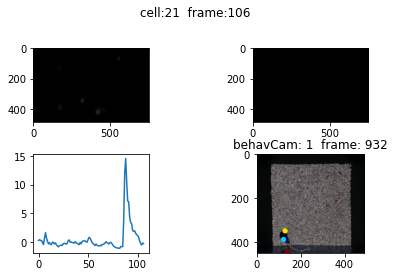

In [159]:
##single events 
#cell=22
anim_2, behav_cam_clip, cells_recombined, single_cell_response = create_event_video(event_start[0], event_end[0], 
                                                                                    velocity_data.loc[session], 
                                                                                    z_scored_events_by_session[session], 
                                                                                    spatial_contours[session], session, [21],
                                                                                   0, 'norm_to_each_video')

In [160]:
anim_2

In [ ]:
## without functions 

In [26]:
velocity_data_for_session = velocity_data.loc[session]

event_start_indicies_in_session = utils_jjm.return_list_of_level_indicies_in_session(z_scored_events_by_session[session].loc['z_scored_movement_regions'], 0)
event_end_indicies_in_session = utils_jjm.return_list_of_level_indicies_in_session(z_scored_events_by_session[session].loc['z_scored_movement_regions'], 1)
event_start = event_start_indicies_in_session[1]
event_end = event_end_indicies_in_session[1]
#create time delta for msCam trace 
time_delta_for_msCam_resampled = list(pd.timedelta_range(start=event_start, end=event_end, freq='.2S'))
#find the closest frames to these in the behacCam data
times_in_velocity_trace = [dlc_utils.nearest(velocity_data_for_session.index, time_delta_msCam) for time_delta_msCam in time_delta_for_msCam_resampled]
# get the behav cam frame indicies for the times in times in velocity trace 
behav_cam_indicies = [int(velocity_data_for_session.loc[td]['behavCam_frames']%1000) for td in times_in_velocity_trace]
# get num of behavCam video
behavCam_video = int((velocity_data_for_session.loc[times_in_velocity_trace[0]]['behavCam_frames'])/1000)+1
behavCam_video_2 = int((velocity_data_for_session.loc[times_in_velocity_trace[-1]]['behavCam_frames'])/1000)+1
#call function to get behavCam clip
behav_cam_clip = load_and_return_behavCam_video(behav_cam_indicies, behavCam_video, session)
all_cell_contours = spatial_contours_by_session[session][:, :]
event_trace = z_scored_events_by_session[session].loc['z_scored_movement_regions'].loc[event_start].loc[event_end]
cells_recombined = generate_event_movie_for_all_cells(event_trace, all_cell_contours)

Frame: 0/1000 ...


100%|██████████| 91/91 [00:37<00:00,  2.40it/s]


In [27]:
## now just run generate_event_movie_for_all_cells but with single cell 
# for cell in columns from z scored movement dataframe 
cell = 21
single_cell_response = generate_cell_trace(cell, all_cell_contours, event_trace, (0, len(event_trace)))

In [28]:
#generate combined animation 
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2)
plt.subplots_adjust(wspace=0.3)

im = ax1.imshow(cells_recombined[0,:,:], cmap='gray', vmin=0, vmax=255)
im2 = ax2.imshow(single_cell_response[0,:,:], cmap='gray', vmin=0, vmax=255)
ax3.plot(z_scored_events_by_session[session].loc['z_scored_movement_regions'][cell].loc[event_start].loc[event_end])
im4 = ax4.imshow(behav_cam_clip[0])
plt.close()

def init():
    im.set_data(cells_recombined[0,:,:])
    im2.set_data(single_cell_response[0,:,:])
    im4.set_data(behav_cam_clip[0])
    
def animate(i):
    im.set_data(cells_recombined[i,:,:])
    im2.set_data(single_cell_response[i,:,:])
    im4.set_data(behav_cam_clip[i])
    return (im, im2, im4)
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=cells_recombined.shape[0],
                               interval=50)
rc('animation', html='jshtml')


In [29]:
anim

In [16]:
event_trace = z_scored_events_by_session[session].loc['z_scored_movement_regions'].loc[event_start].loc[event_end]

d1 = 752
d2 = 480

frame_range = (0, len(event_trace))
cells_reshaped = np.empty((np.shape(all_cell_contours)[1], frame_range[1], d2, d1))
for cell in tqdm(list(event_trace.columns)):
    # "spatial components", or "A" as dense matrix, cells are 1 indexed, spatial array is 0 indexed  
    A_reshaped = np.reshape(all_cell_contours[:, cell-1], (d2, d1))
    #cell_frames = []
    #for frame in range(frame_range[0], frame_range[1]):
        #cell_frames.append(np.array([np.dot(A_reshaped, item) for item in [255, 128, 0, z_scored_regions_by_session[session][sample][cell][frame]]]))
    cells_reshaped[cell-1] = np.array([np.dot(A_reshaped, event_trace[cell][frame]) for frame in range(frame_range[0], frame_range[1])])
cells_recombined = np.sum(cells_reshaped, axis=0)

100%|██████████| 91/91 [00:51<00:00,  1.76it/s]


In [52]:
plt.plot(event_trace[10])

KeyError: 10

In [58]:
event_trace

,1,2,3,4,5,6,7,8,9,11,...,105,106,109,110,116,121,123,126,134,136
0,-0.453001,0.335944,0.611605,0.281796,-0.534945,-0.613423,-0.888105,-0.833773,-0.572369,-0.604215,...,-0.733892,-0.359114,-0.429623,-0.221421,-0.593166,-0.787829,0.048785,-0.491525,-0.333766,0.996038
1,-0.506015,0.299332,0.399161,0.127453,-0.534377,-0.614267,-0.888149,-0.831803,-0.572478,-0.600762,...,-0.742488,-0.358016,-0.429828,-0.220148,-0.604011,-0.791897,-0.065780,-0.486643,-0.376970,1.493927
2,-0.549411,0.584387,0.219751,-0.004320,-0.534483,-0.615578,-0.888177,-0.834315,-0.572743,-0.598576,...,-0.746413,-0.358318,-0.429989,-0.220874,-0.627869,-0.790347,0.265390,-0.489403,-0.407956,0.745642
3,-0.584934,0.878910,0.068239,-0.116825,-0.534860,-0.616512,-0.888194,-0.835288,-0.572885,-0.599728,...,-0.748205,-0.357753,-0.430115,-0.220990,-0.601717,-0.783738,0.223845,-0.468838,-0.430179,0.100475
4,-0.614012,0.746946,-0.059714,-0.212879,-0.535059,-0.617176,-0.888204,-0.832092,-0.572821,-0.582260,...,-0.749023,-0.355506,-0.430214,-0.218205,-0.591818,-0.790829,-0.227050,-0.483507,-0.446117,-0.289471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,-0.374164,1.607143,-0.751110,-0.648033,-0.535900,-0.614465,-0.887400,-0.838031,-0.571509,-0.609527,...,-0.749694,-0.352546,-0.427697,-0.221025,-0.640111,-0.799987,0.099120,-0.447945,-0.151913,-0.337612
103,-0.441483,1.409463,0.066640,-0.666410,-0.536039,-0.613311,-0.887717,-0.838184,-0.569566,-0.609858,...,-0.749703,-0.342688,-0.428318,-0.221686,-0.640870,-0.800616,0.329810,-0.444248,-0.246547,-0.241955
104,-0.496587,1.066010,0.032663,-0.682100,-0.536155,-0.612887,-0.887912,-0.838279,-0.569277,-0.610079,...,-0.749707,-0.347385,-0.428804,-0.220695,-0.641143,-0.767029,0.873833,-0.442887,-0.314418,-0.084036
105,-0.173778,0.781747,-0.089757,-0.695495,-0.536252,-0.612183,-0.887998,-0.836048,-0.570637,-0.610226,...,-0.736271,-0.357844,-0.429186,-0.220345,-0.641241,-0.779708,0.287508,-0.420921,-0.363094,-0.262357


In [82]:
event_trace.iloc[:,list(np.where(event_trace.max(axis=0)>5)[0])]

,21,22,24,28,30,32,45,47,55,58,59,60,68,70,78,80,95
0,0.279630,-0.020623,-0.596515,-0.910647,-0.977104,-0.434806,-0.181421,-0.679683,-0.002585,-0.497224,0.736005,-0.182130,-0.731594,-0.227545,-0.587483,0.151605,2.748110
1,0.425188,-0.049399,-0.828779,-0.911420,-0.979463,-0.403211,-0.234625,-0.699105,-0.170469,-0.497265,0.528004,-0.201341,-0.796729,-0.250550,-0.643985,-0.028313,2.071497
2,0.274097,0.582724,-0.996573,-0.912076,-0.981473,-0.439200,-0.278425,-0.714646,-0.091959,-0.497298,0.286414,-0.219192,-0.843417,-0.291892,-0.683066,-0.176106,1.520953
3,0.277957,0.348962,-1.117792,-0.912633,-0.983185,-0.466659,-0.263671,-0.727081,0.119451,-0.497325,0.080177,-0.235780,-0.876880,-0.262411,-0.710098,-0.297510,1.072988
4,-0.084993,0.638113,-1.205364,-0.913105,-0.984644,-0.487610,-0.411298,-0.737032,-0.074924,-0.497347,-0.095881,0.215149,-0.900866,-0.292757,-0.728795,-0.397237,0.708489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,0.233813,-0.836496,0.051341,-0.083329,-0.081437,1.663376,-0.063617,-0.496123,1.071850,-0.395688,-1.117933,-0.171182,-0.844910,-0.091412,-0.515058,-0.560231,3.662725
103,-0.213164,-0.306008,0.648502,-0.116872,-0.216381,4.067842,-0.222068,-0.552223,0.670732,-0.414751,-1.118668,-0.191168,-0.877951,-0.154030,-0.593890,1.911283,2.815698
104,-0.512247,-0.223437,0.336146,-0.238062,-0.331349,6.670649,-0.381259,-0.597113,0.356687,-0.430243,-1.119295,-0.209739,-0.901633,-0.208277,-0.648416,4.008004,2.126492
105,-0.169245,-0.343669,-0.154999,-0.340867,-0.176824,5.756453,-0.496203,-0.633033,0.705663,-0.442833,-1.119830,-0.226996,-0.837988,-0.255271,-0.686131,5.209281,1.565701


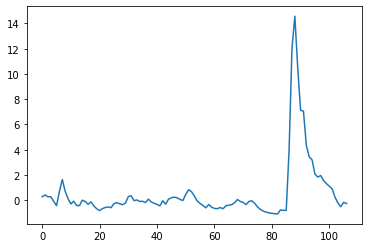

In [83]:
plt.plot(event_trace[21])

In [74]:
event_trace[[1,2]]

,1,2
0,-0.453001,0.335944
1,-0.506015,0.299332
2,-0.549411,0.584387
3,-0.584934,0.878910
4,-0.614012,0.746946
...,...,...
102,-0.374164,1.607143
103,-0.441483,1.409463
104,-0.496587,1.066010
105,-0.173778,0.781747
